### Laboratorium 6 - część 1/2

W pakiecie OpenCV wszystkie zadania związane z detekcją i opisem punktów kluczowych realizowane są przez zestaw specjalnych klas, dla których bazową jest `cv::Feature2D`. Jedną z wielu pochodnych tej klasy jest interesująca nas na zajęciach `cv::SIFT`, z której dokumentacją należy się zapoznać.  
Najważniejsze, co trzeba wiedzieć:
1. do konstrukcji obiektu SIFT służy metoda [`cv2.SIFT_create`](https://docs.opencv.org/4.x/d7/d60/classcv_1_1SIFT.html#ad337517bfdc068ae0ba0924ff1661131) - to do niej przekazujemy parametry detektora (w dokumentacji występuje jako `cv::SIFT::create`);
2. obsługujemy detektor przez interfejs `cv::Feature2D`, konkretnie metody [`detect`](https://docs.opencv.org/4.x/d0/d13/classcv_1_1Feature2D.html#aa4e9a7082ec61ebc108806704fbd7887) do detekcji punktów kluczowych oraz [`compute`](https://docs.opencv.org/4.x/d0/d13/classcv_1_1Feature2D.html#ab3cce8d56f4fc5e1d530b5931e1e8dc0) do obliczania ich deskryptorów (opcjonalnie `detectAndCompute`).

Schemat użycia:
```python
sift_instance = cv2.SIFT_create()
# 'image' powinno być obrazem jednokanałowym (jeśli nie, zostanie zastosowane cvtColor z flagą COLOR_BGR2GRAY)
keypoints = sift_instance.detect(image)
keypoints, descriptors = sift_instance.compute(image, keypoints)
```

`keypoints` jest listą obiektów specjalnego typu `cv2.KeyPoint`, która **jest modyfikowana** przez `SIFT::compute`!  
`descriptors` jest natomiast macierzą float32 o wymiarach NxK, gdzie N jest liczbą punktów kluczowych, a K jest liczbą obliczonych cech.

Warto również zapoznać się z funkcją [`cv2.drawKeypoints`](https://docs.opencv.org/4.x/d4/d5d/group__features2d__draw.html#ga5d2bafe8c1c45289bc3403a40fb88920) w kontekście prezentacji wyników. Zwróć uwagę na flagi sterujące rysowaniem - szczególnie użyteczna jest `cv2.DRAW_MATCHES_FLAGS_DRAW_RICH_KEYPOINTS`.

In [1]:
import cv2
import matplotlib.pyplot as plt
import numpy as np
from PIL import Image

#### Zadanie 1

Przetestuj wpływ podstawowych parametrów detektora SIFT (`contrastThreshold` i `edgeThreshold`) na uzyskiwane punkty kluczowe (liczność, lokalizacja, rozmiar), korzystając z obrazów `cells` i `lena`. Pamiętaj że ich działanie jest odwrotne (tzn. jeden odsiewa cechy "mniejsze niż", a drugi "większe niż").

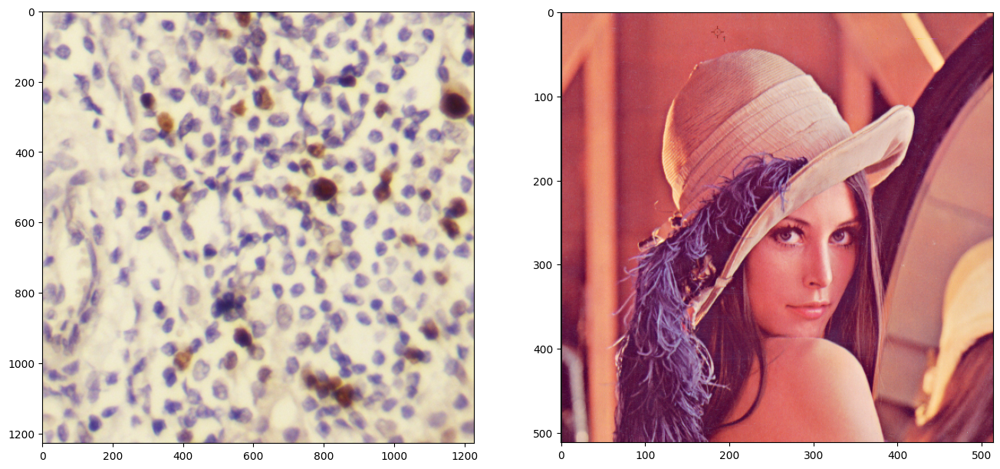

In [2]:
cells = cv2.imread('Data/p1_0317_11.jpg')
lena = cv2.imread('Przyklady/Lena.jpg')
f, (a1, a2) = plt.subplots(1, 2, figsize=(16, 10))
a1.imshow(cells[..., ::-1]);
a2.imshow(lena[..., ::-1]);

In [3]:
def get_keypoints(image, contrastThreshold, edgeThreshold):
    sift_instance = cv2.SIFT_create(contrastThreshold=contrastThreshold, edgeThreshold=edgeThreshold)
    keypoints = sift_instance.detect(image, None)     # 'image' powinno być obrazem jednokanałowym (jeśli nie, zostanie zastosowane cvtColor z flagą COLOR_BGR2GRAY)
    #keypoints, descriptors = sift_instance.compute(image, keypoints)

    return keypoints

In [4]:
# TODO: zrob tutaj sprawdzanie roznych wartosci parametrow
def sift_params_experiment(image):
    contrastThresholds = [0.01, 0.05, 0.1, 0.15]
    edgeThresholds = [1, 10, 20, 30, 100]
    fig, ax = plt.subplots(len(edgeThresholds), len(contrastThresholds), figsize=(14,20))
    for i, edgeThreshold in enumerate(edgeThresholds):
        for j, contrastThreshold in enumerate(contrastThresholds):
            keypoints = get_keypoints(image, contrastThreshold, edgeThreshold)
            image_keypoints = cv2.drawKeypoints(image[..., ::-1], keypoints, None, flags=cv2.DRAW_MATCHES_FLAGS_DRAW_RICH_KEYPOINTS)
            average_kp_size = np.mean([kp.size for kp in keypoints])
            ax[i][j].imshow(image_keypoints)
            ax[i][j].set_title(f'CT: {contrastThreshold}, ET: {edgeThreshold}. \nLiczba KP: {len(keypoints)}, \nSredni rozmiar KP: {round(average_kp_size, 2)}')

    plt.tight_layout()
    plt.show()

/home/robert/Studia/AiPOiW/env/lib/python3.10/site-packages/numpy/core/fromnumeric.py:3464: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/home/robert/Studia/AiPOiW/env/lib/python3.10/site-packages/numpy/core/_methods.py:192: RuntimeWarning: invalid value encountered in scalar divide
  ret = ret.dtype.type(ret / rcount)


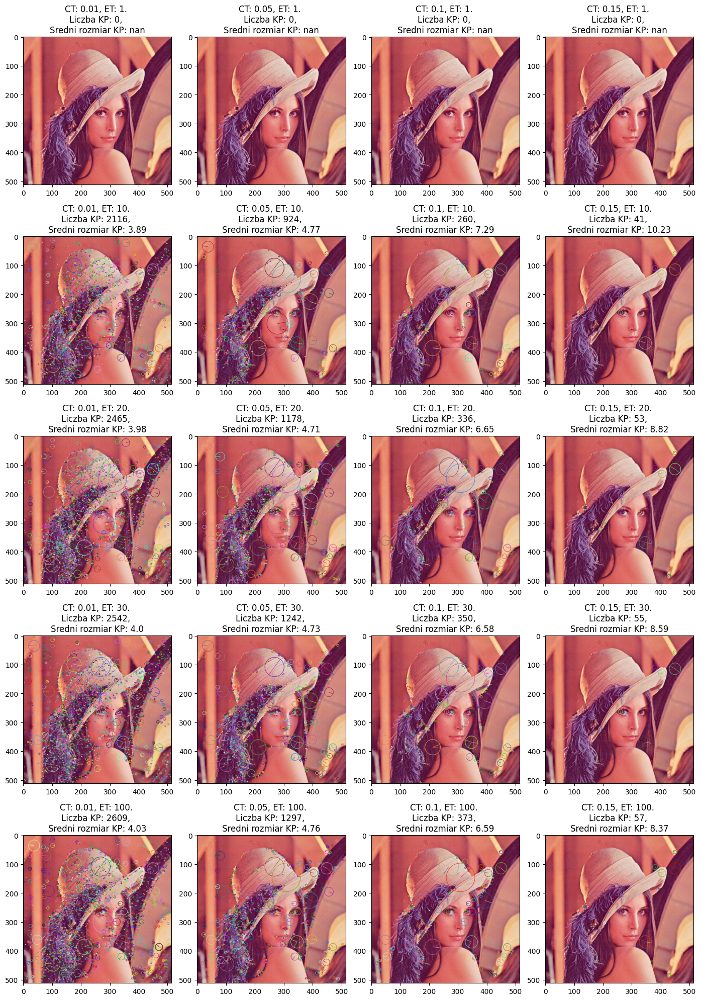

In [5]:
sift_params_experiment(lena)

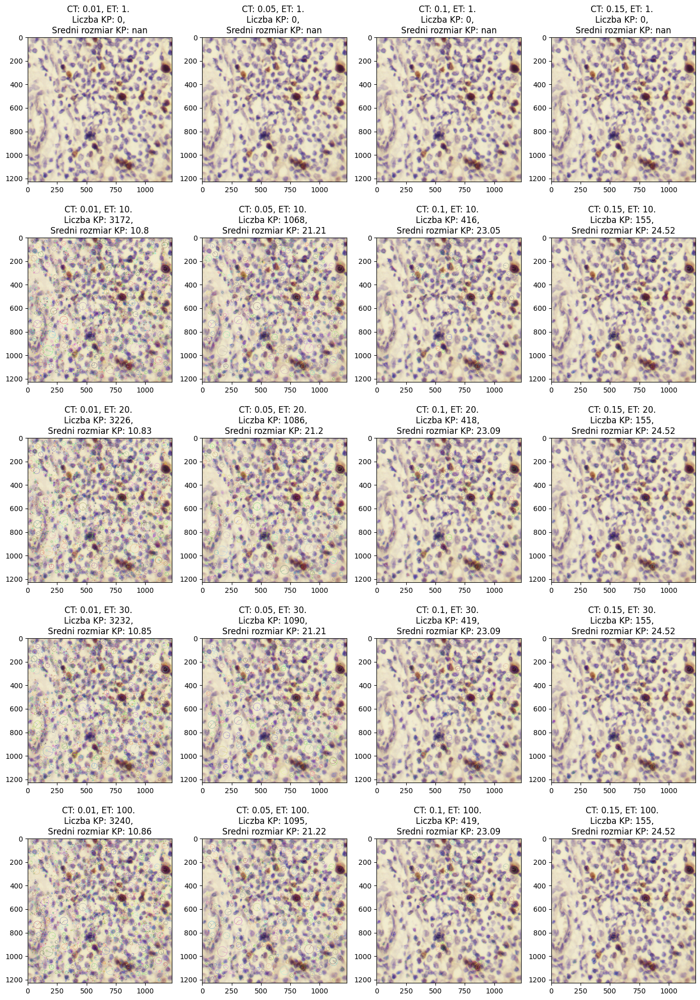

In [6]:
sift_params_experiment(cells)

#### Zadanie 2

Detektor SIFT jest w teorii niezmienniczy względem translacji, rotacji czy zmiany skali. Przetestuj te własności w praktyce, oceniając wizualnie stabilność punktów wykrywanych na obróconej i przeskalowanej wersji obrazów `cells` i `lena`.

In [7]:
def rotate(image, angle, scale=1.0):
    center = (image.shape[0] // 2, image.shape[1] // 2)
    rmat = cv2.getRotationMatrix2D(center, angle, scale)
    return cv2.warpAffine(image, rmat, (image.shape[0], image.shape[1]), flags=cv2.INTER_CUBIC)

In [8]:
def check_keypoints_invariance(image):
    angles = [30, 45, 60, 90, 180]
    scales = [0.5, 0.75, 1, 1.25]
    fig, ax = plt.subplots(len(angles), len(scales), figsize=(16, 20))
    for i, angle in enumerate(angles):
        for j, scale in enumerate(scales):
            image_rotated = rotate(image, angle=angle, scale=scale)
            keypoints = get_keypoints(image_rotated, 0.04, 10)
            image_keypoints = cv2.drawKeypoints(image_rotated[..., ::-1], keypoints, None, flags=cv2.DRAW_MATCHES_FLAGS_DRAW_RICH_KEYPOINTS)
            average_kp_size = np.mean([kp.size for kp in keypoints])
            ax[i][j].imshow(image_keypoints)
            ax[i][j].set_title(f'Angle: {angle}, Scale: {scale}. \nLiczba KP: {len(keypoints)}, \nSredni rozmiar KP: {round(average_kp_size, 2)}')

    plt.tight_layout()
    plt.show()

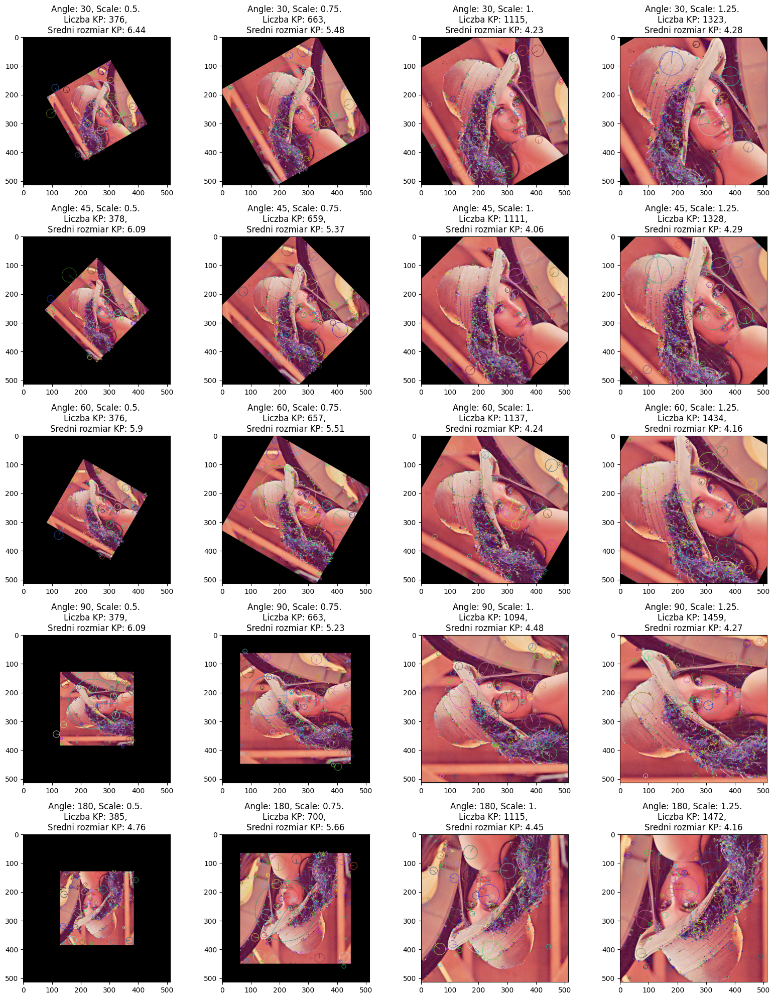

In [9]:
check_keypoints_invariance(lena)

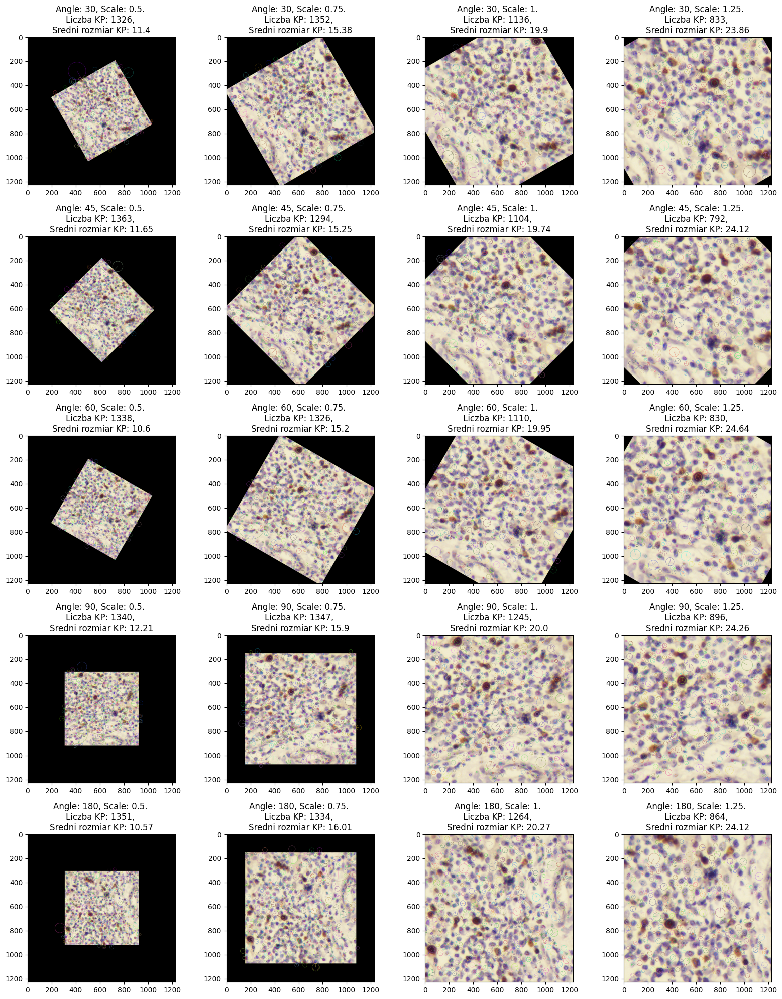

In [10]:
check_keypoints_invariance(cells)